In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import correlate
from scipy.signal import butter, filtfilt

In [5]:
def bandpass_filter(data, lowcut, highcut, fs, order=4):
    """
    Applies a Butterworth bandpass filter to the input signal.

    Parameters:
    - data: Input signal (numpy array)
    - lowcut: Lower cutoff frequency (Hz)
    - highcut: Upper cutoff frequency (Hz)
    - fs: Sampling rate (Hz)
    - order: Order of the Butterworth filter (default=4)

    Returns:
    - Filtered signal (numpy array)
    """
    nyq = 0.5 * fs  # Nyquist frequency
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')  # Create bandpass filter
    return filtfilt(b, a, data)  # Apply filter with zero-phase distortion

def lowpass_filter(data, cutoff, fs, order=4):
    """
    Applies a Butterworth low-pass filter to the input signal.

    Parameters:
    - data: Input signal (numpy array)
    - cutoff: Cutoff frequency (Hz)
    - fs: Sampling rate (Hz)
    - order: Order of the filter

    Returns:
    - Filtered signal (numpy array)
    """
    nyq = 0.5 * fs  # Nyquist frequency
    normal_cutoff = cutoff / nyq  # Normalize cutoff frequency
    print(cutoff)
    print(normal_cutoff)
    b, a = butter(order, normal_cutoff, btype='low', analog=False)  # Design filter
    return filtfilt(b, a, data)  # Apply filter using zero-phase filtering

In [3]:
%matplotlib ipympl

ModuleNotFoundError: No module named 'ipympl'

# 5.2

In [ ]:
#peak to peak 0.1, data is of 0.4MHz wave. 20db attenuator added
SAMPLE_RATES = np.arange(1e6, 3.3e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    sdr_data = np.load(f"sdr_data/{SAMPLE_RATE}_sdr_data.npz")
    full_sdr = np.concatenate(sdr_data['arr_0'])
    
    plt.figure(figsize=(10, 6))
    plt.plot(full_sdr)
    plt.grid(True)
    ax = plt.gca()
    plt.title(f"Raw SDR Data: Sample Rate of {SAMPLE_RATE/1e6}MHz")
    plt.show()

In [ ]:
#peak to peak 0.1, data is of 0.8MHz wave. 20db attenuator added
SAMPLE_RATES = np.arange(1e6, 3.3e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    sdr_data = np.load(f"sdr_data/{SAMPLE_RATE}_sdr_al_data.npz")
    full_sdr = np.concatenate(sdr_data['arr_0'])
    
    plt.figure(figsize=(10, 6))
    plt.plot(full_sdr)
    plt.grid(True)
    ax = plt.gca()
    ax.set_xlim([4000, 4150])
    plt.title(f"Raw SDR Data: Sample Rate of {SAMPLE_RATE/1e6}MHz")
    plt.show()

# 5.3

In [ ]:
SAMPLE_RATES = np.arange(1e6, 3.3e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    sdr_data = np.load(f"sdr_data/{SAMPLE_RATE}_sdr_data.npz")
    full_sdr = np.concatenate(sdr_data['arr_0'])
    fft_transform = np.fft.fft(full_sdr)
    freq = np.fft.fftfreq(20480, 1/(SAMPLE_RATE/1e6))
        
    plt.figure(figsize=(10, 6))
    plt.plot(freq, fft_transform.real, label='Real Component')
    plt.plot(freq, fft_transform.imag, label='Imaginary Component')
    plt.grid(True)
    plt.title(f"Fourier Transform: Sample Rate of {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.show()

In [ ]:
SAMPLE_RATES = np.arange(1e6, 3.3e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    sdr_data = np.load(f"sdr_data/{SAMPLE_RATE}_sdr_data.npz")
    full_sdr = np.concatenate(sdr_data['arr_0'])
    filtered_sdr = bandpass_filter(full_sdr, lowcut=350e3, highcut=450e3, fs=SAMPLE_RATE)
    N = len(filtered_sdr)
    fft_transform = np.fft.fft(filtered_sdr)
    power_spectrum_normalized = np.abs(fft_transform) ** 2
    ifft_power_spectrum = np.fft.ifft((power_spectrum_normalized))
    acf_scipy = correlate(filtered_sdr, filtered_sdr, mode="full", method="fft")
    acf_scipy = acf_scipy[len(acf_scipy)//2:]
    acf_fft = np.fft.fft(acf_scipy) 
    acf_fft_magnitude = np.abs(acf_fft)
    freq = np.fft.fftfreq(N, 1/(SAMPLE_RATE/1e6))

    plt.figure(figsize=(12, 5))
    plt.plot(freq[:N//2], (acf_fft_magnitude[:N//2]), label="FFT of ACF")
    plt.plot(freq[:N//2], (power_spectrum_normalized[:N//2]), label="Power Spectrum", linestyle="--")
    plt.title(f"Comparison of FFT of ACF and Power Spectrum: Sample Rate of {SAMPLE_RATE/1e6}MHz")
    plt.xlabel("Frequency (MHz)")
    plt.ylabel("Power")
    plt.legend()
    plt.grid()
    ax = plt.gca()
    ax.set_ylim([0, 4.0e10])
    ax.set_xlim([0.35, 0.45])
    plt.show()
    

# 5.4

In [ ]:
SAMPLE_RATES = np.arange(1e6, 3.3e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    sdr_data = np.load(f"sdr_data/{SAMPLE_RATE}_sdr_data.npz")
    full_sdr = np.concatenate(sdr_data['arr_0'])
    N = len(full_sdr)
    t = np.arange(N) / SAMPLE_RATE
    N_freq = 10 * N
    f0 = 400e3
    frequencies = np.linspace(-SAMPLE_RATE/2, SAMPLE_RATE/2, N_freq)
    power_spectrum_high_res = np.zeros(N_freq, dtype=np.complex128)
    for k, f in enumerate(frequencies):
        exponentials = np.exp(-2j * np.pi * f * t)
        power_spectrum_high_res[k] = np.sum(full_sdr * exponentials)
    power_spectrum_high_res = np.abs(power_spectrum_high_res) ** 2

    plt.figure(figsize=(12, 5))
    plt.plot(frequencies / 1e6, 10 * np.log10(power_spectrum_high_res), label="Power Spectrum (High-Resolution)")
    plt.axvline(x=f0 / 1e6, color='r', linestyle='--', label="Expected Frequency (0.4 MHz)")
    plt.xlabel("Frequency (MHz)")
    plt.ylabel("Power (dB)")
    plt.title(f"High-Resolution Power Spectrum (Log Scale): Sampling Rate of {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.grid(True)
    ax = plt.gca()
    ax.set_xlim(0)
    plt.show()

# 5.5

In [ ]:
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    fr_data = np.load(f"sdr_data/{SAMPLE_RATE}_sdr_fr_data.npz")
    plt.plot(fr_data['arr_0'][0])
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.title(f"Power Spectra: {SAMPLE_RATE/1e6}MHz")
    plt.show()
    plt.figure()
    fft_transform = np.fft.fft(fr_data['arr_0'][0])
    power_spectra = np.abs(fft_transform)**2
    freq = np.fft.fftfreq(2048, 1/(SAMPLE_RATE/1e6))
    plt.plot(freq, power_spectra)
    ax = plt.gca()
    ax.set_ylim(0)
    plt.title(f"Fourier Transform: {SAMPLE_RATE/1e6}MHz")
    plt.show()

# 5.6

In [ ]:
sdr_data = np.load("sdr_data/sdr_nw4_data.npz") #peak tp peak 0.1, 20db attenuator
full_sdr = np.concatenate(sdr_data['arr_0'])

plt.figure(figsize=(10, 6))
plt.plot(full_sdr)
plt.grid(True)
ax = plt.gca()
plt.title(f"Raw SDR Data: Sample Rate of {1.0}MHz")
plt.show()

In [ ]:
sdr_data_1 = np.load("sdr_data/sdr_nw1_data.npz")
sdr_data_2 = np.load("sdr_data/sdr_nw2_data.npz")
sdr_data_3 = np.load("sdr_data/sdr_nw3_data.npz")
sdr_data_4 = np.load("sdr_data/sdr_nw4_data.npz")
full_sdr_1 = np.concatenate(sdr_data_1['arr_0'])
full_sdr_2 = np.concatenate(sdr_data_2['arr_0'])    
full_sdr_3 = np.concatenate(sdr_data_3['arr_0'])
full_sdr_4 = np.concatenate(sdr_data_4['arr_0'])
N = len(full_sdr_1)
fft_transform_1 = np.fft.fft(full_sdr_1)
fft_transform_2 = np.fft.fft(full_sdr_2)
fft_transform_3 = np.fft.fft(full_sdr_3)
fft_transform_4 = np.fft.fft(full_sdr_4)
power_spectrum_1 = np.abs(fft_transform_1) ** 2
power_spectrum_2 = np.abs(fft_transform_2) ** 2
power_spectrum_3 = np.abs(fft_transform_3) ** 2
power_spectrum_4 = np.abs(fft_transform_4) ** 2

freq = np.fft.fftfreq(N, 1)

plt.figure(figsize=(15, 9))
plt.plot(freq, power_spectrum_1, label="Power Spectrum: Nyquist Window 1", linestyle="--")
plt.plot(freq, power_spectrum_2, label="Power Spectrum: Nyquist Window 2", linestyle="--")
plt.plot(freq, power_spectrum_3, label="Power Spectrum: Nyquist Window 3", linestyle="--")
plt.plot(freq, power_spectrum_4, label="Power Spectrum: Nyquist Window 4", linestyle="--")
plt.title(f"Power Spectrum for 0.5, 1.0, 1.5, 2.0MHz Signal: Sample Rate of {1.0}MHz")
plt.xlabel("Frequency (MHz)")
plt.ylabel("Power")
plt.legend()
plt.grid()
ax = plt.gca()
plt.xticks(np.arange(-2.0, 2.1, 0.1))
plt.show()

# 5.7

In [ ]:
SAMPLE_RATES = np.arange(1e6, 3.3e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    ng_data = np.load(f"noise_generator_data/{SAMPLE_RATE}_noise_generator_data.npz")
    plt.figure(figsize=(10, 6))
    ng_full = np.concatenate(ng_data['arr_0'])
    plt.hist(ng_full, bins=50, edgecolor='black')
    plt.title(f"Histogram of Data: {SAMPLE_RATE}")
    plt.xlabel('Value')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

# 7.1

In [ ]:
required_rates = [2*1170000,2*1230000]
additional_rates = np.arange(2.5e6, 3.3e6, 1e5)
SAMPLE_RATES = np.sort(np.array(required_rates+list(additional_rates)))
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_sum_data = np.load(f"mixer_data/{SAMPLE_RATE}_sum_freq_data.npz")
    mixer_diff_data = np.load(f"mixer_data/{SAMPLE_RATE}_diff_freq_data.npz")
    plt.plot(mixer_sum_data['arr_0'][0], label='Sum Frequency')
    plt.plot(mixer_diff_data['arr_0'][0], label='Diff Frequency')
    #plt.axhline(y=127, color='r', linestyle='-')
    #plt.axhline(y=-128, color='r', linestyle='-')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.show()

# 7.3.1

In [ ]:
required_rates = [2*1170000,2*1230000]
additional_rates = np.arange(2.5e6, 3.3e6, 1e5)
SAMPLE_RATES = np.sort(np.array(required_rates+list(additional_rates)))
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    real_mixer_sum_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.1_real_sum_freq_data.npz")
    imag_mixer_sum_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.1_imag_sum_freq_data.npz")
    plt.plot(real_mixer_sum_data['arr_0'][0], label='Real Sum Frequency')
    plt.plot(imag_mixer_sum_data['arr_0'][0], label='Imag Sum Frequency')
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.show()

In [ ]:
required_rates = [2*1170000,2*1230000]
additional_rates = np.arange(2.5e6, 3.3e6, 1e5)
SAMPLE_RATES = np.sort(np.array(required_rates+list(additional_rates)))
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    real_mixer_diff_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.1_real_diff_freq_data.npz")
    imag_mixer_diff_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.1_imag_diff_freq_data.npz")
    plt.plot(real_mixer_diff_data['arr_0'][0], label='Real Diff Frequency')
    plt.plot(imag_mixer_diff_data['arr_0'][0], label='Imag Diff Frequency')
    #plt.axhline(y=127, color='r', linestyle='-')
    #plt.axhline(y=-128, color='r', linestyle='-')
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.show()

# 7.3.2

In [ ]:
required_rates = [2*1170000,2*1230000]
additional_rates = np.arange(2.5e6, 3.3e6, 1e5)
SAMPLE_RATES = np.sort(np.array(required_rates+list(additional_rates)))
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    real_mixer_sum_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.2_real_sum_freq_data.npz")
    imag_mixer_sum_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.2_imag_sum_freq_data.npz")
    plt.plot(real_mixer_sum_data['arr_0'][0], label='Real Sum Frequency')
    plt.plot(imag_mixer_sum_data['arr_0'][0], label='Imag Sum Frequency')
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.show()

In [ ]:
required_rates = [2*1170000,2*1230000]
additional_rates = np.arange(2.5e6, 3.3e6, 1e5)
SAMPLE_RATES = np.sort(np.array(required_rates+list(additional_rates)))
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    real_mixer_diff_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.2_real_diff_freq_data.npz")
    imag_mixer_diff_data = np.load(f"mixer_data/{SAMPLE_RATE}_7.3.2_imag_diff_freq_data.npz")
    plt.plot(real_mixer_sum_data['arr_0'][0], label='Real Diff Frequency')
    plt.plot(imag_mixer_sum_data['arr_0'][0], label='Imag Diff Frequency')
    #plt.axhline(y=127, color='r', linestyle='-')
    #plt.axhline(y=-128, color='r', linestyle='-')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    plt.show()

# 7.3.3

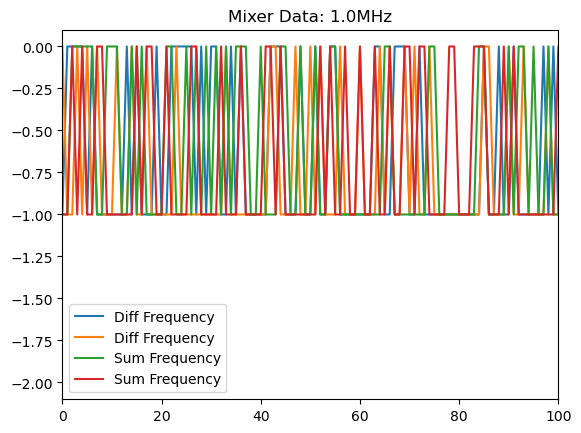

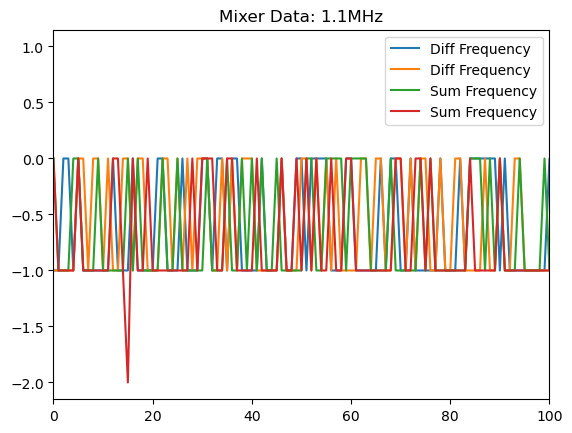

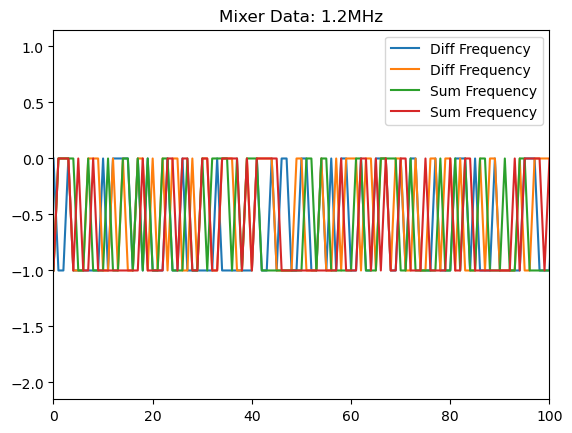

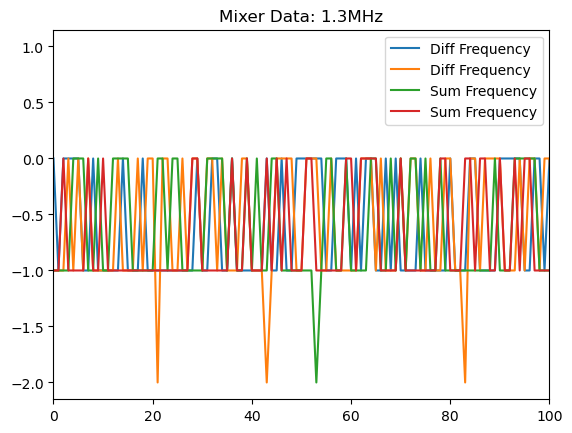

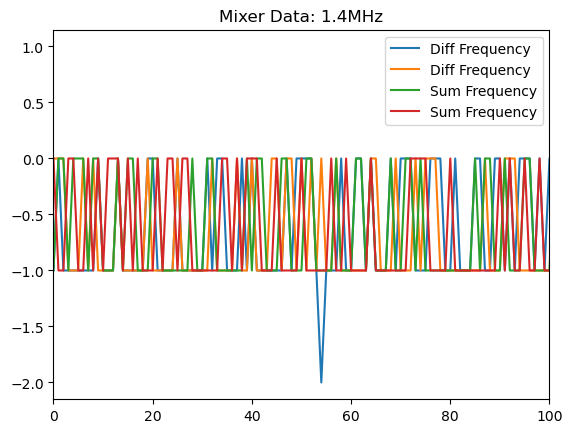

...

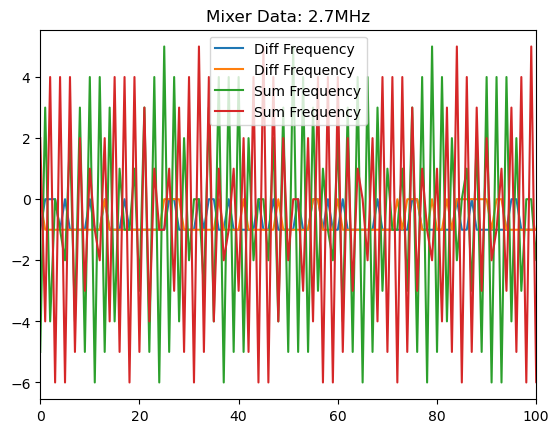

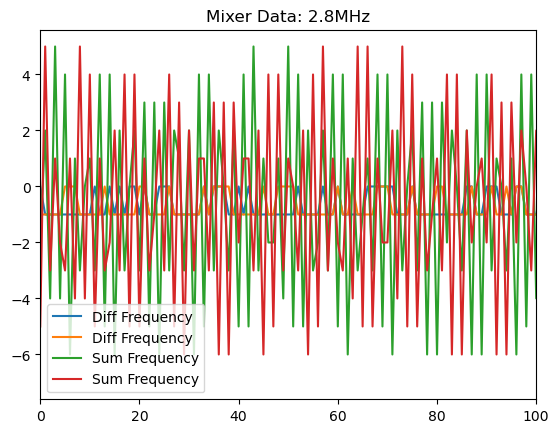

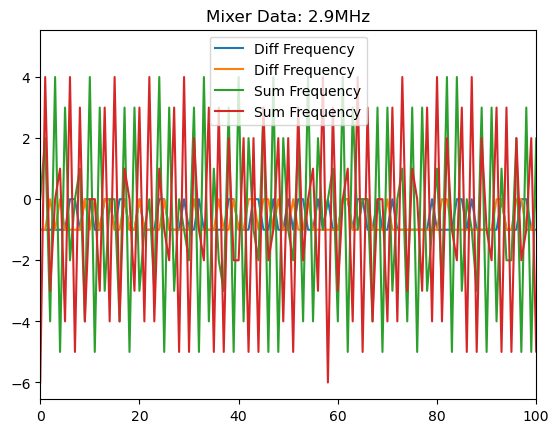

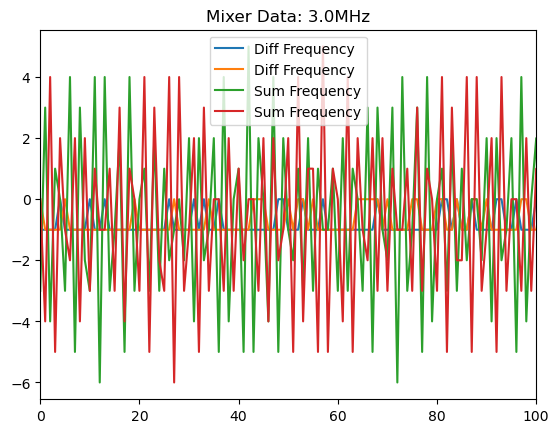

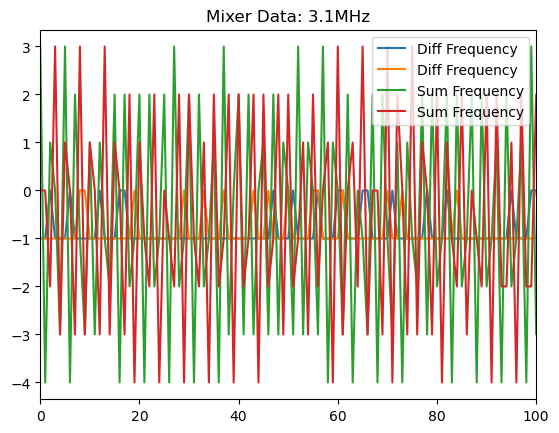

In [7]:
SAMPLE_RATES = np.arange(1.0e6, 3.2e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_diff_data = np.load(f"mixer_data/{SAMPLE_RATE}7.3.3_diff_freq_data.npz")
    mixer_sum_data = np.load(f"mixer_data/{SAMPLE_RATE}7.3.3_sum_freq_data.npz")
    plt.plot(mixer_diff_data['arr_0'][0], label='Diff Frequency')
    plt.plot(mixer_sum_data['arr_0'][0], label='Sum Frequency')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.show()

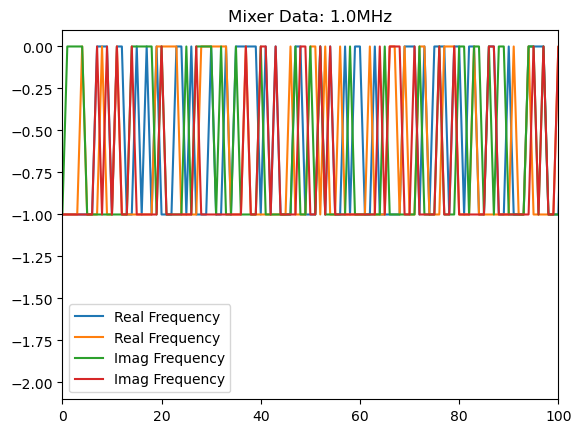

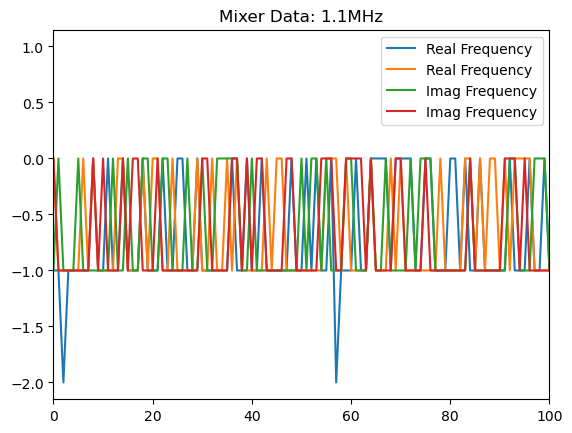

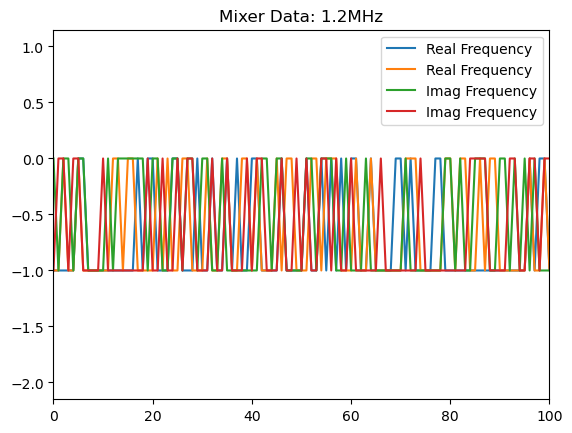

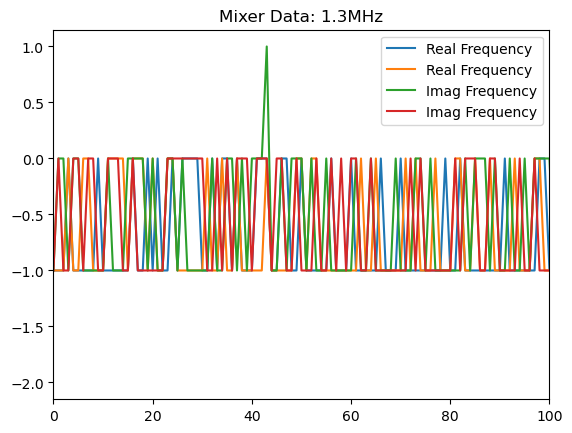

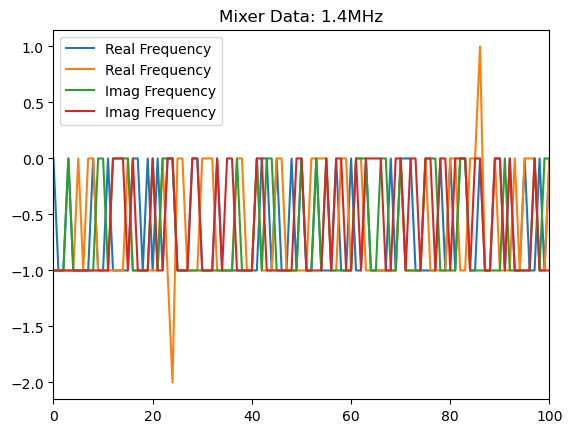

...

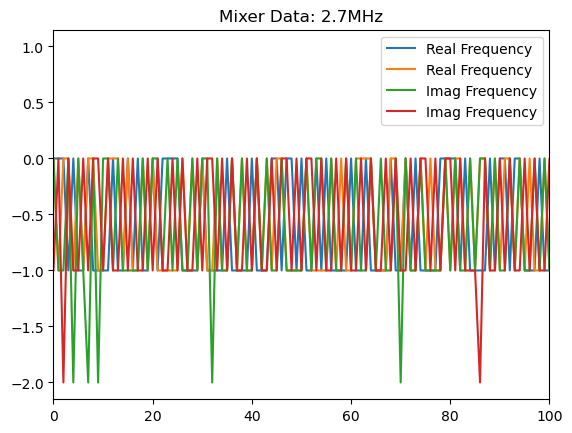

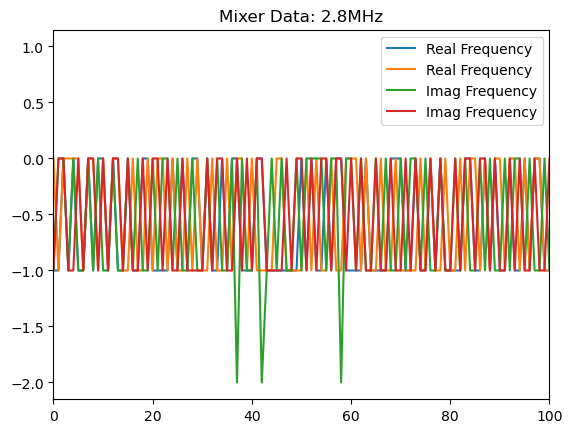

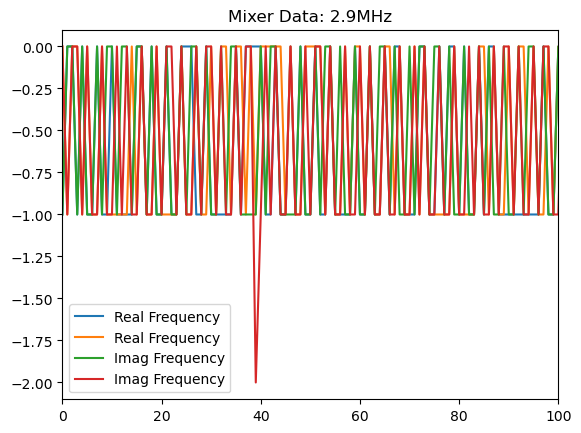

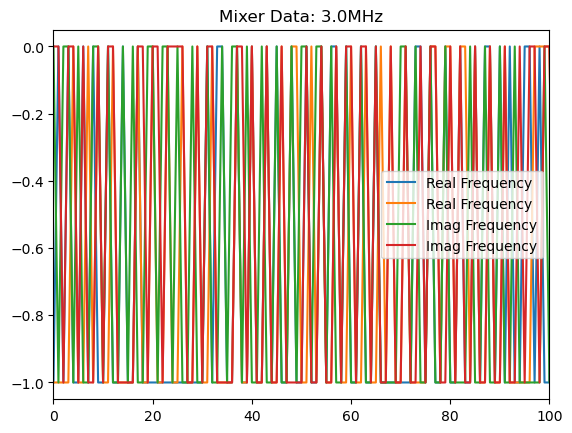

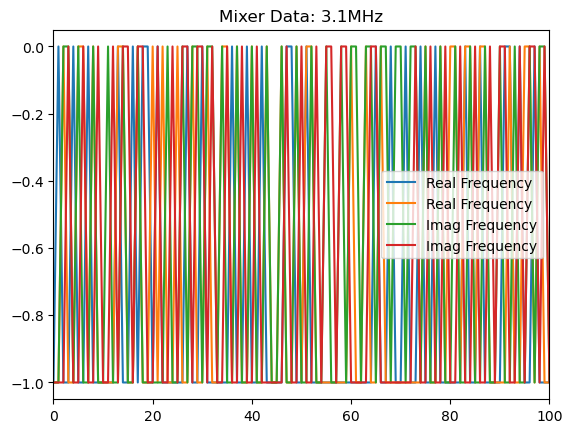

In [14]:
SAMPLE_RATES = np.arange(1.0e6, 3.2e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_real_data = np.load(f"real_mixer_data/{SAMPLE_RATE}7.3.3_0.2a_sum_freq_data.npz")
    mixer_imag_data = np.load(f"imag_mixer_data/{SAMPLE_RATE}7.3.3_0.2a_imag_sum_freq_data.npz")
    plt.plot(mixer_real_data['arr_0'][0], label='Real Frequency')
    plt.plot(mixer_imag_data['arr_0'][0], label='Imag Frequency')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz")
    plt.legend()
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.show()

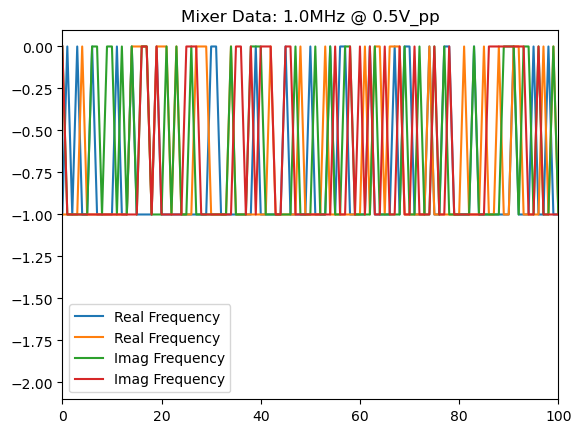

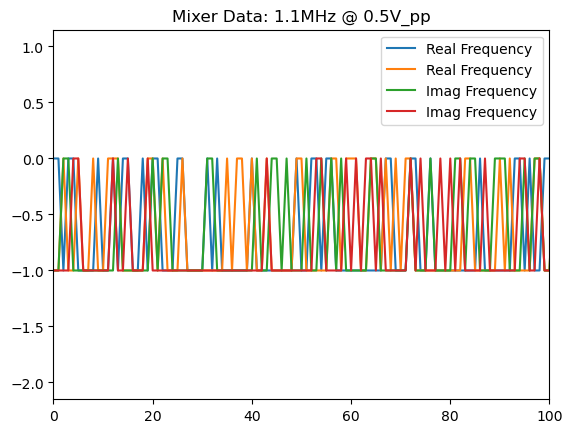

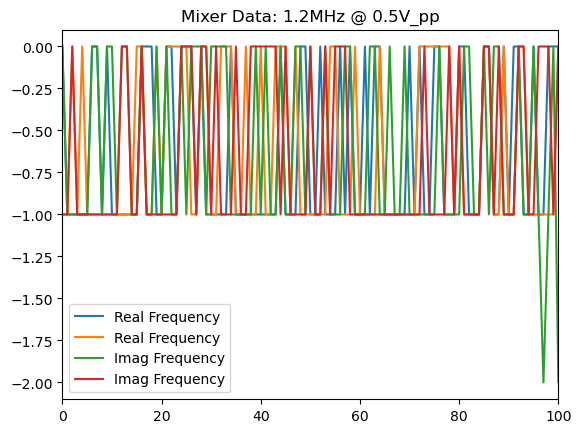

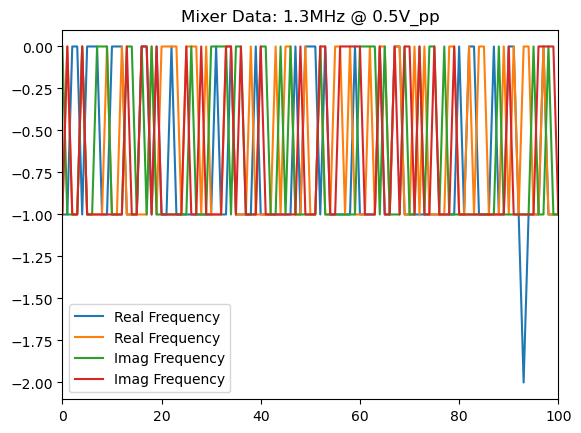

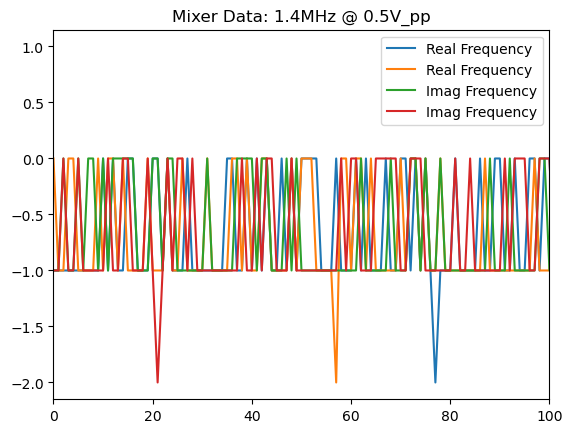

...

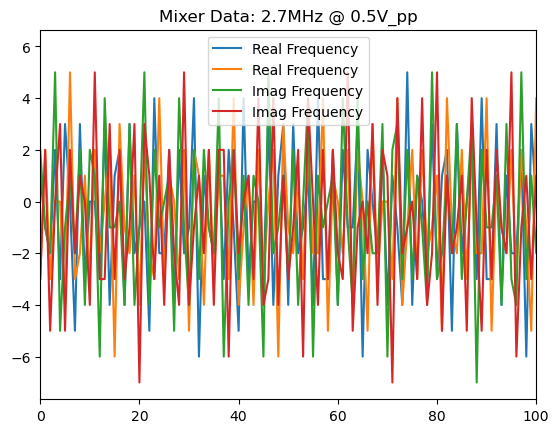

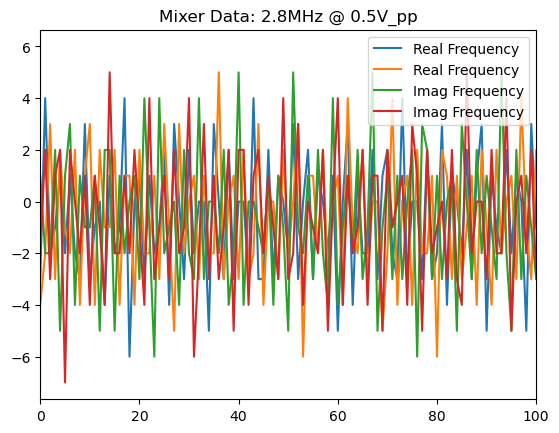

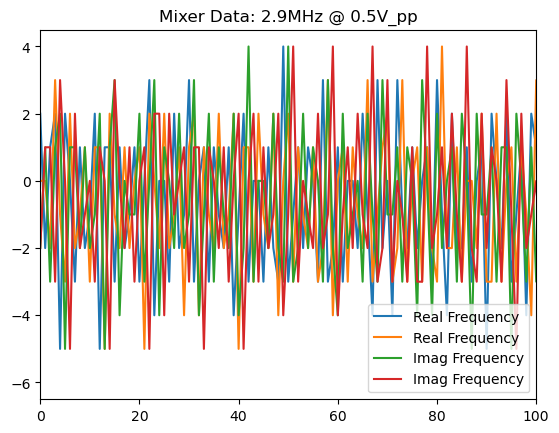

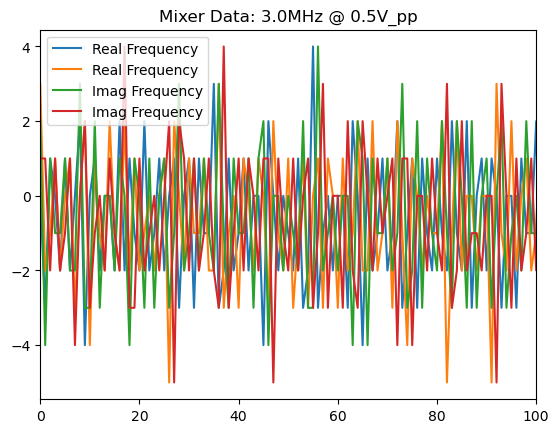

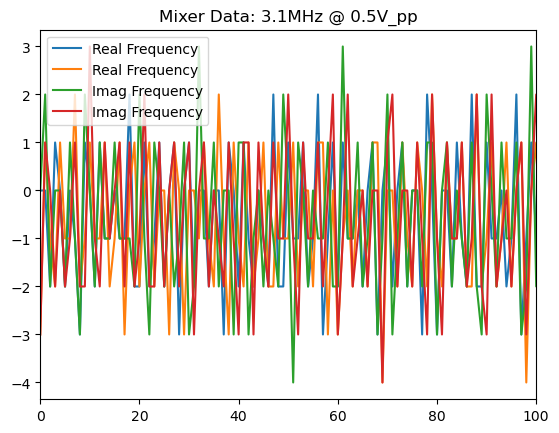

In [13]:
SAMPLE_RATES = np.arange(1.0e6, 3.2e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_real_data = np.load(f"real_mixer_data/{SAMPLE_RATE}7.3.3_0.5a_sum_freq_data.npz")
    mixer_imag_data = np.load(f"imag_mixer_data/{SAMPLE_RATE}7.3.3_05a_sum_freq_data.npz")
    plt.plot(mixer_real_data['arr_0'][0], label='Real Frequency')
    plt.plot(mixer_imag_data['arr_0'][0], label='Imag Frequency')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz @ 0.5V_pp")
    plt.legend()
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.show()

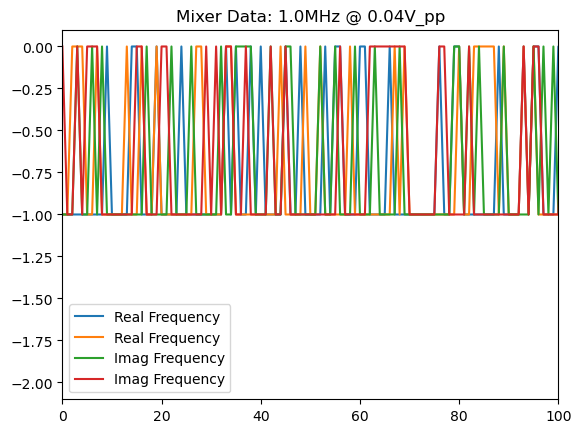

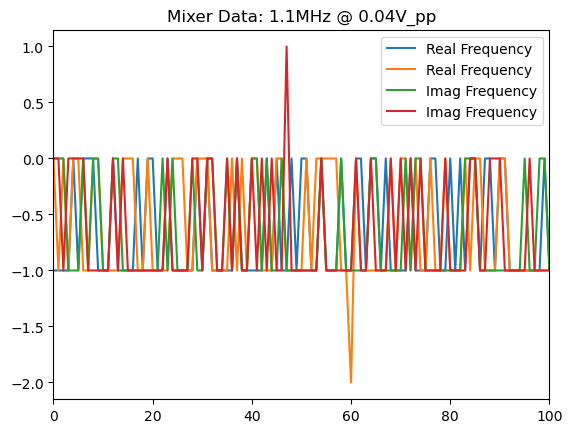

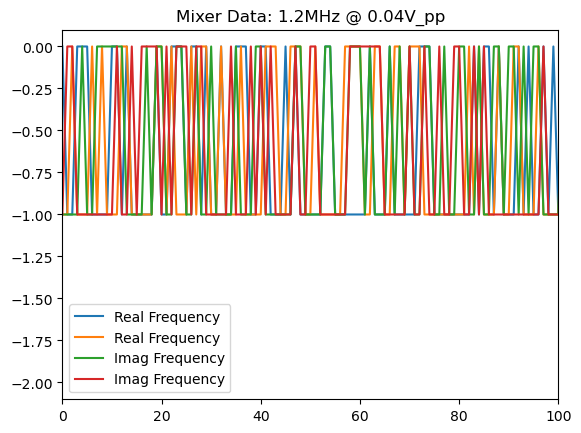

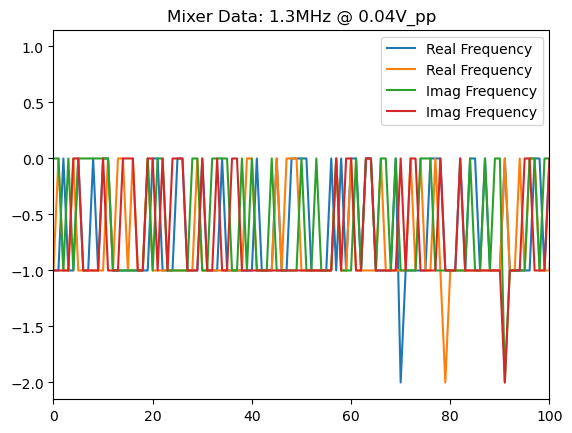

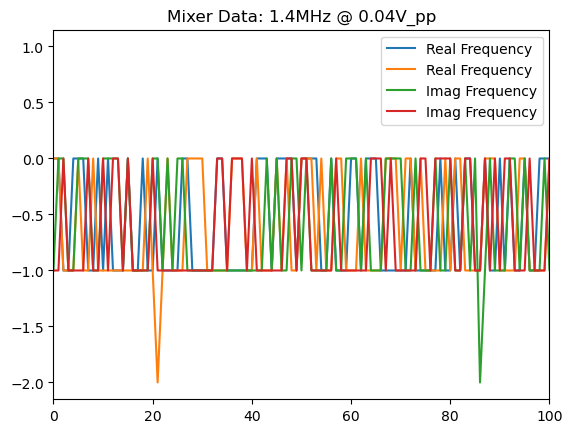

...

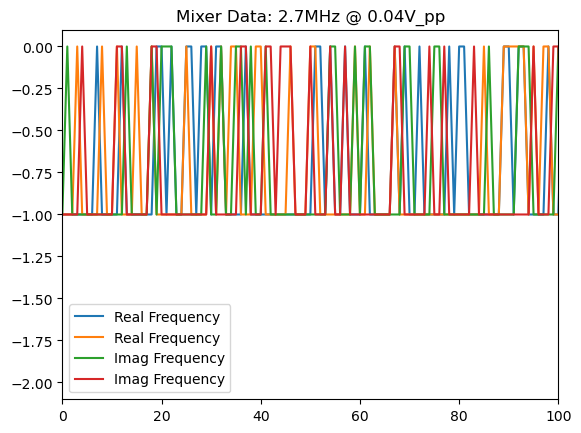

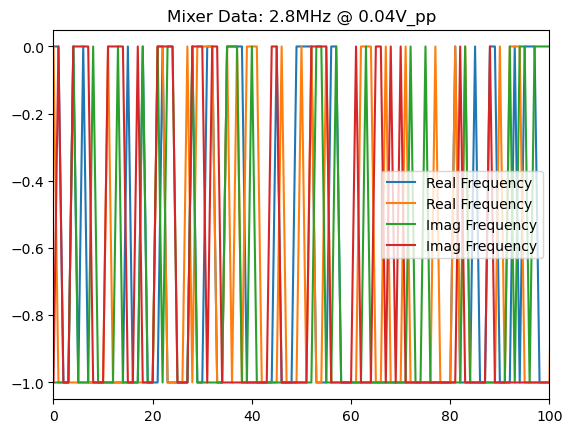

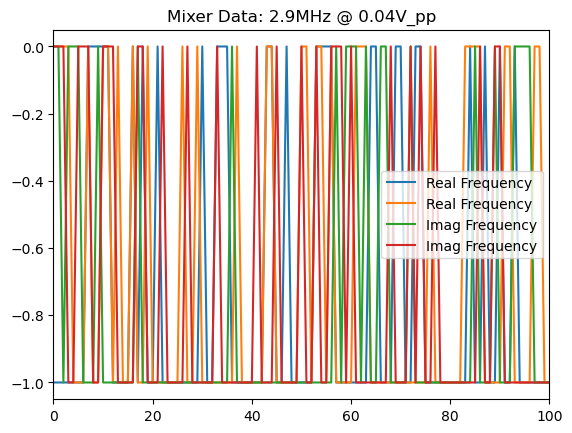

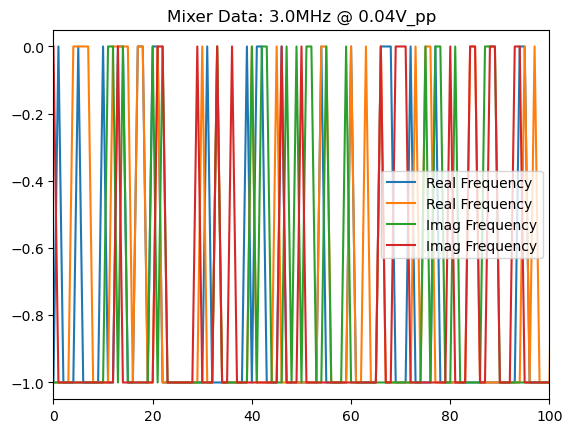

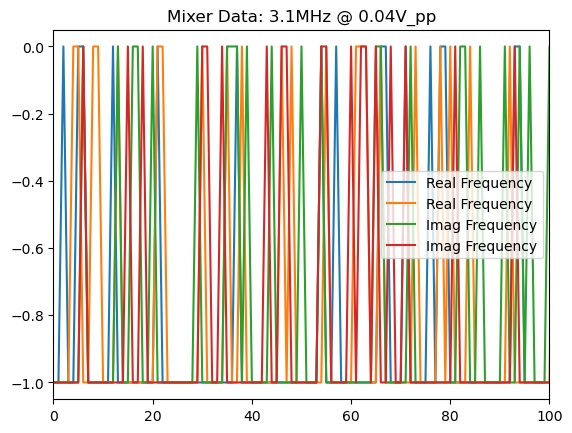

In [16]:
SAMPLE_RATES = np.arange(1.0e6, 3.2e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_real_data = np.load(f"real_mixer_data/{SAMPLE_RATE}7.3.3_0.04a_sum_freq_data.npz")
    mixer_imag_data = np.load(f"imag_mixer_data/{SAMPLE_RATE}7.3.3_0.04a_sum_freq_data.npz")
    plt.plot(mixer_real_data['arr_0'][0], label='Real Frequency')
    plt.plot(mixer_imag_data['arr_0'][0], label='Imag Frequency')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz @ 0.04V_pp")
    plt.legend()
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.show()

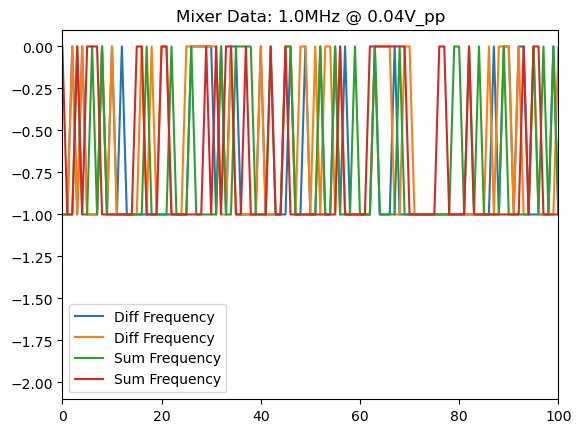

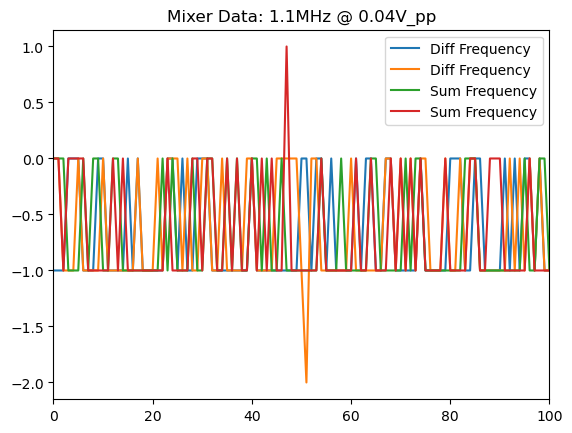

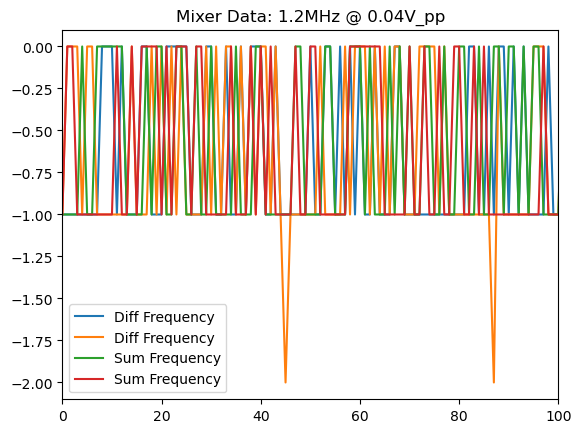

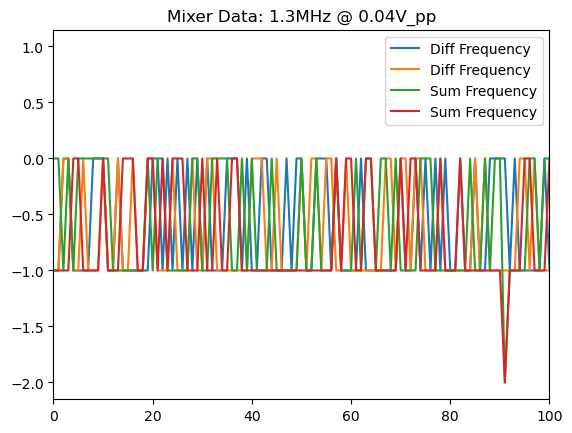

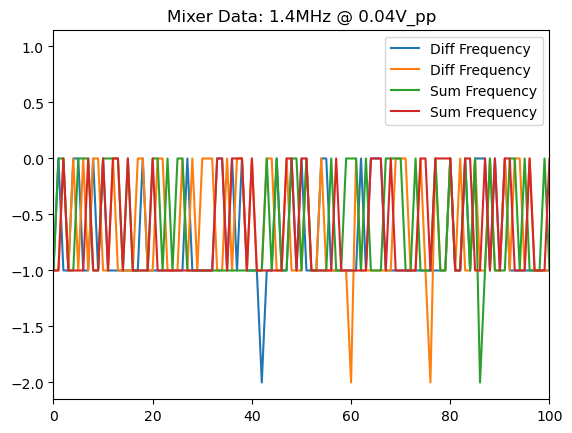

...

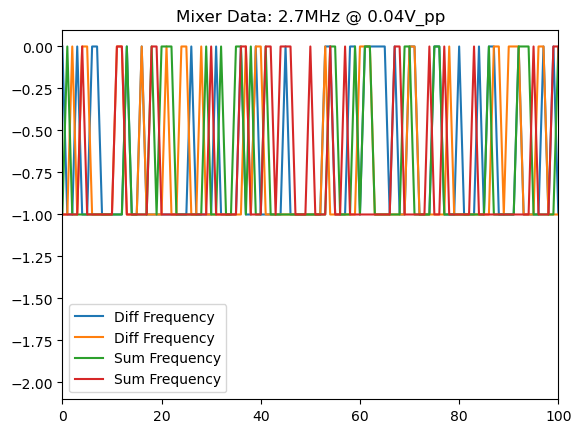

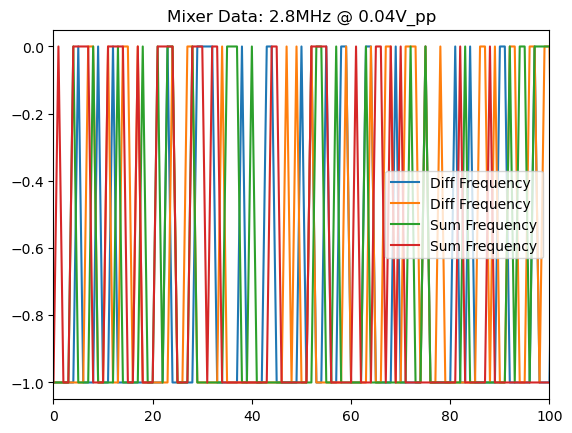

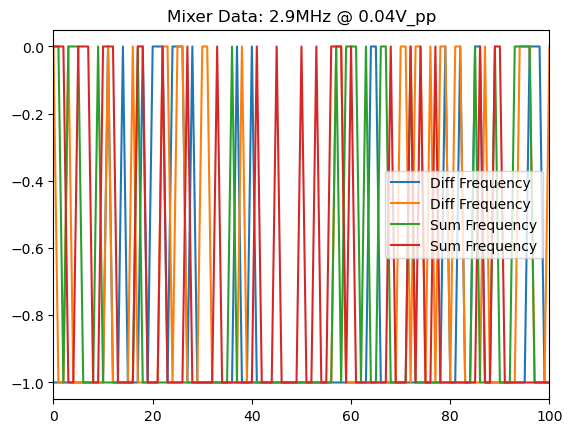

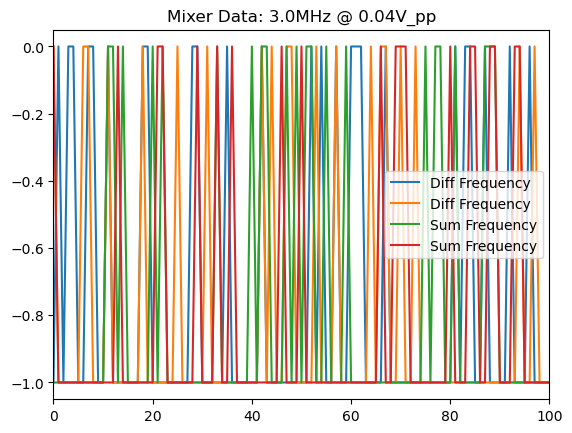

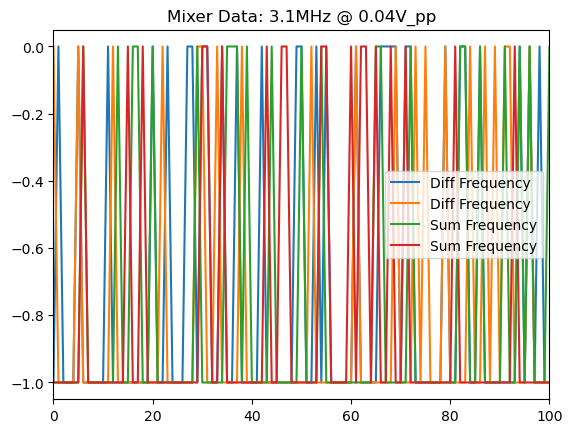

In [17]:
SAMPLE_RATES = np.arange(1.0e6, 3.2e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_imag_diff_data = np.load(f"imag_mixer_data/{SAMPLE_RATE}7.3.3_0.04a_diff_freq_data.npz")
    mixer_imag_sum_data = np.load(f"imag_mixer_data/{SAMPLE_RATE}7.3.3_0.04a_sum_freq_data.npz")
    plt.plot(mixer_imag_diff_data['arr_0'][0], label='Diff Frequency')
    plt.plot(mixer_imag_sum_data['arr_0'][0], label='Sum Frequency')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz @ 0.04V_pp")
    plt.legend()
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.show()

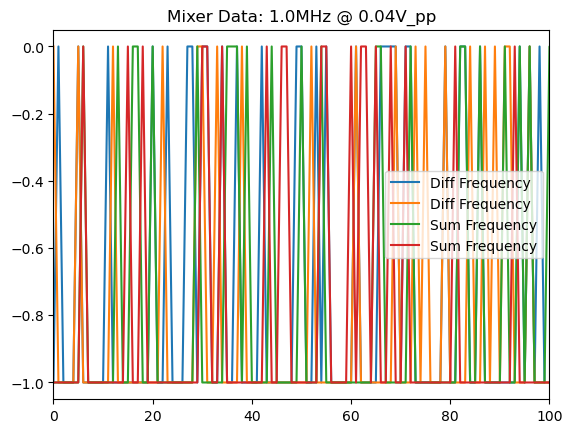

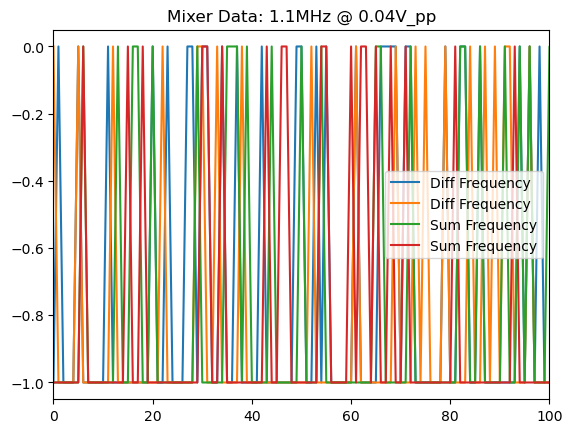

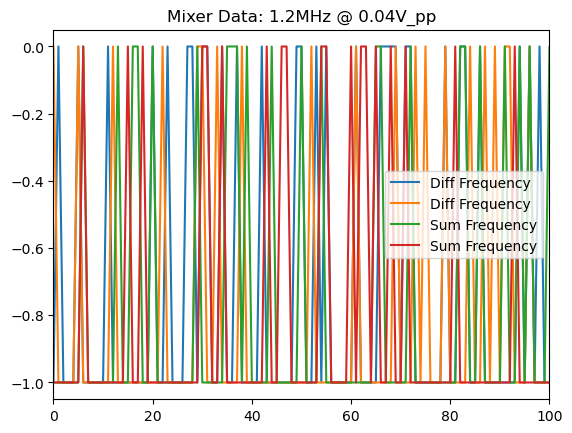

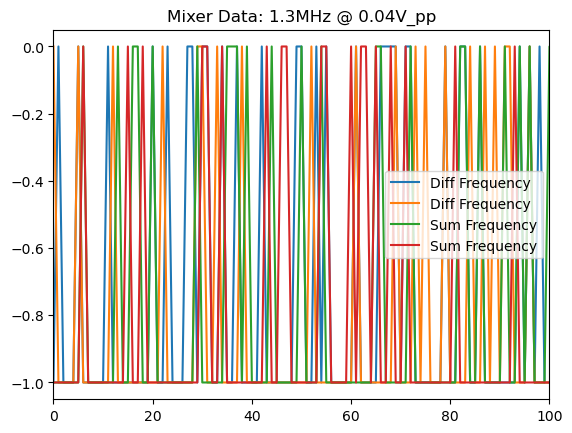

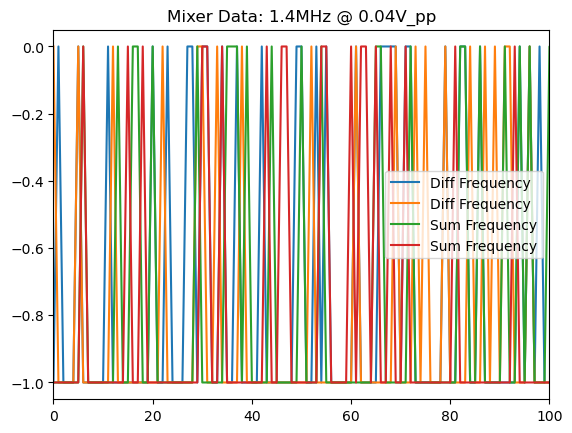

...

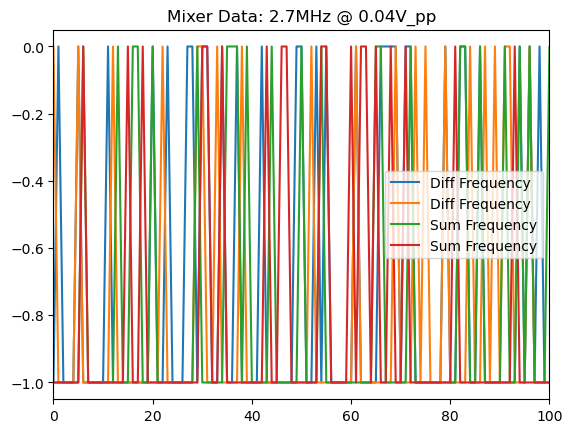

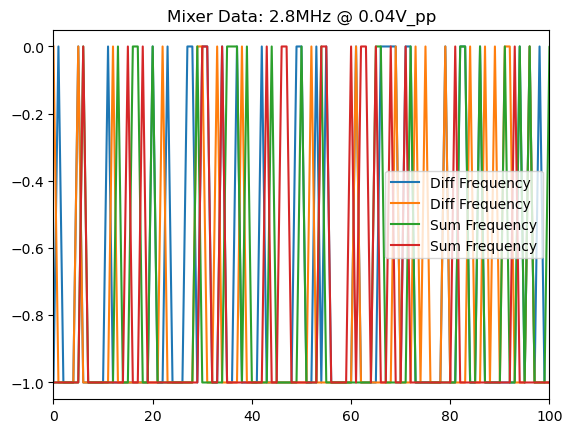

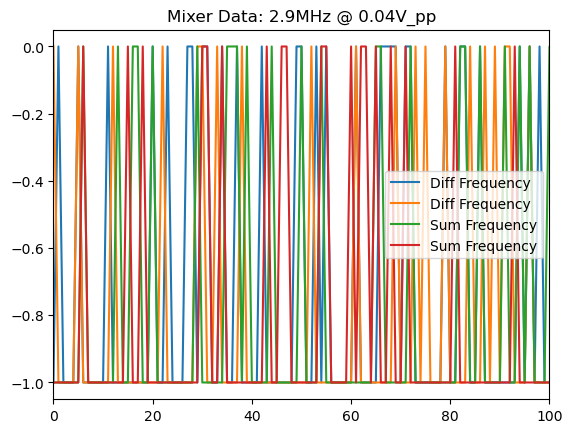

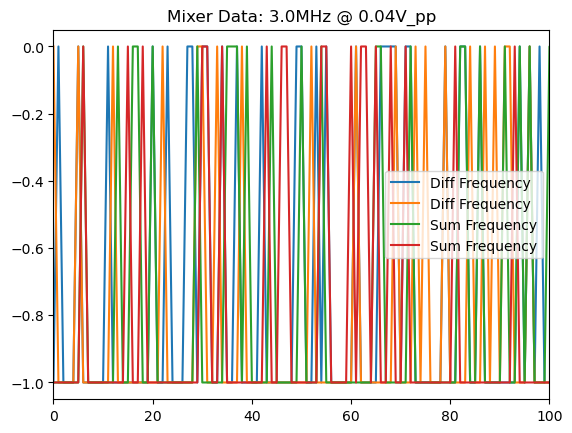

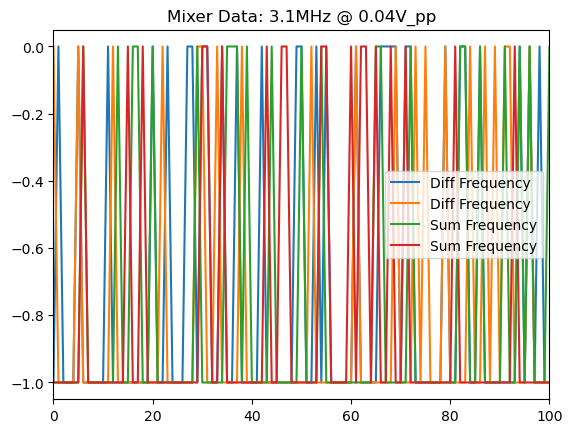

In [18]:
SAMPLE_RATES = np.arange(1.0e6, 3.2e6, 1e5)
for SAMPLE_RATE in SAMPLE_RATES:
    plt.figure()
    mixer_real_diff_data = np.load(f"real_mixer_data/{SAMPLE_RATE}7.3.3_0.04a_diff_freq_data.npz")
    mixer_real_sum_data = np.load(f"real_mixer_data/{SAMPLE_RATE}7.3.3_0.04a_sum_freq_data.npz")
    plt.plot(mixer_imag_diff_data['arr_0'][0], label='Diff Frequency')
    plt.plot(mixer_imag_sum_data['arr_0'][0], label='Sum Frequency')
    ax = plt.gca()
    plt.title(f"Mixer Data: {SAMPLE_RATE/1e6}MHz @ 0.04V_pp")
    plt.legend()
    ax = plt.gca()
    ax.set_xlim([0, 100])
    plt.show()